<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Meta" data-toc-modified-id="Meta-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Meta</a></span><ul class="toc-item"><li><span><a href="#Brain-region-info" data-toc-modified-id="Brain-region-info-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Brain region info</a></span></li><li><span><a href="#Cell-Metadata" data-toc-modified-id="Cell-Metadata-1.2"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>Cell Metadata</a></span></li></ul></li><li><span><a href="#Plot" data-toc-modified-id="Plot-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Plot</a></span></li></ul></div>

In [1]:
import configparser
import pathlib

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy.api as sc
import seaborn as sns
import xarray as xr
import warnings
import anndata
from cemba_data.local.mc.prepare_study import prepare_study
from cemba_data.plot import *
from cemba_data.plot.preprocessing import *
from cemba_data.tools.hdf5.anndata import highly_variable_methylation_feature
from ALLCools.mcds.MCDS import MCDS
from cemba_data.tools.hdf5.anndata import rank_features_groups

/home/hanliu/miniconda3/envs/clustering/lib/python3.7/site-packages/xarray/core/merge.py:18: FutureWarning: The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version
  PANDAS_TYPES = (pd.Series, pd.DataFrame, pd.Panel)
/home/hanliu/miniconda3/envs/clustering/lib/python3.7/site-packages/xarray/core/dataarray.py:1829: FutureWarning: The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version
  'DataArray', pd.Series, pd.DataFrame, pd.Panel]:


## Meta

In [2]:
result_dir = pathlib.Path()
result_dir.mkdir(exist_ok=True)
fig_dir = result_dir / 'fig'
fig_dir.mkdir(exist_ok=True)

### Brain region info

In [3]:
brain_region = pd.read_csv('/home/hanliu/project/mouse_rostral_brain/misc/BrainRegion.txt',
                           sep='\t', index_col='ID')
major_region_palette = brain_region.set_index('MajorRegion')['MajorRegionColor'].to_dict()
sub_region_palette = brain_region.set_index('SubRegion')['SubRegionColor'].to_dict()
region_palette = brain_region['RegionColor'].to_dict()

### Cell Metadata

In [4]:
cell_meta = pd.read_msgpack('cell_coords_and_clusters.msg')
cell_meta['MajorRegion'] = cell_meta['Region'].map(brain_region['MajorRegion'])
cell_meta['SubRegion'] = cell_meta['Region'].map(brain_region['SubRegion'])

/home/hanliu/miniconda3/envs/clustering/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3326: FutureWarning: The read_msgpack is deprecated and will be removed in a future version.
It is recommended to use pyarrow for on-the-wire transmission of pandas objects.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [7]:
cell_meta['Region'].value_counts().sum()

100449

## Plot

In [5]:
coords = 'umap'

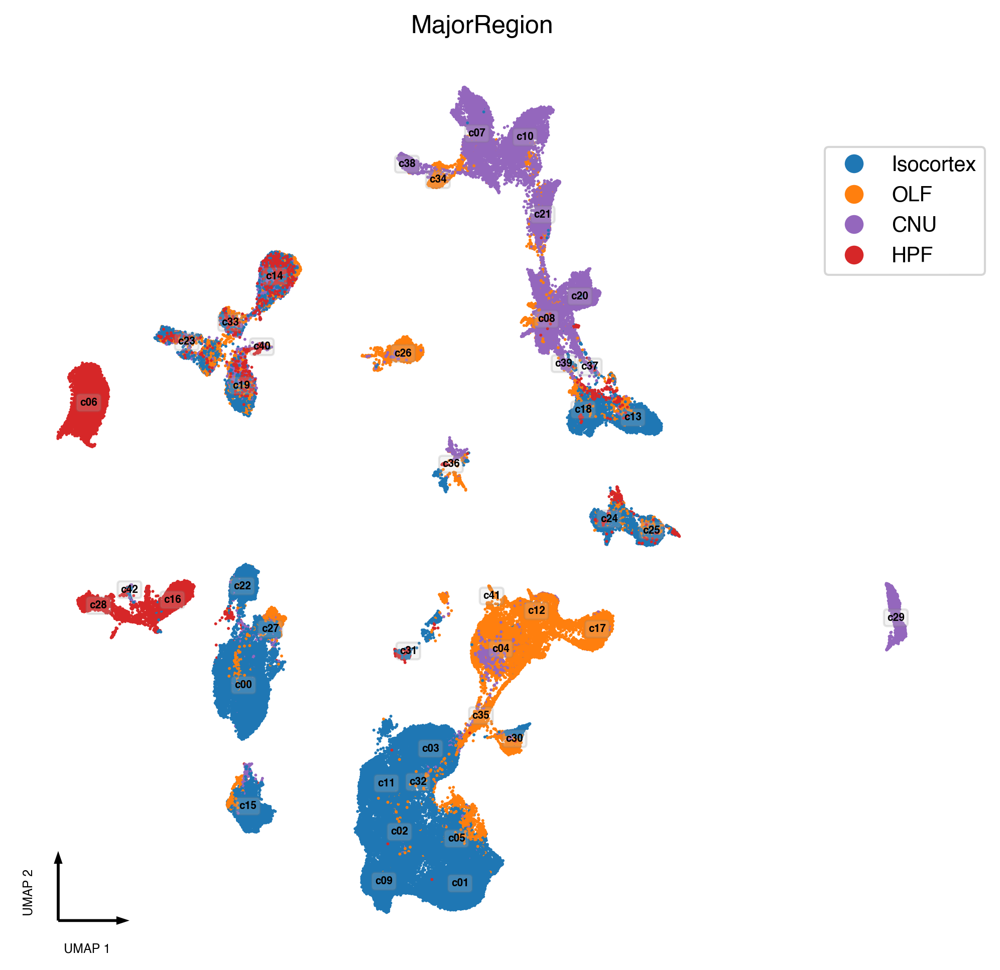

In [6]:
fig, ax = plt.subplots(figsize=(8, 8), dpi=300)
categorical_scatter(cell_meta, 
                    ax, 
                    coord_base=coords, 
                    hue='MajorRegion',
                    text_anno='leiden',
                    palette=major_region_palette,
                    show_legend=True,
                    scatter_kws=dict(s=2),
                    text_anno_kws=dict(fontsize=5),
                    legend_kws=dict(bbox_to_anchor=(1.05, 0.9)),
                    max_points=None)
ax.set_title('MajorRegion')
fig.savefig(fig_dir / f'MajorRegion_{coords}.pdf', bbox_inches='tight')

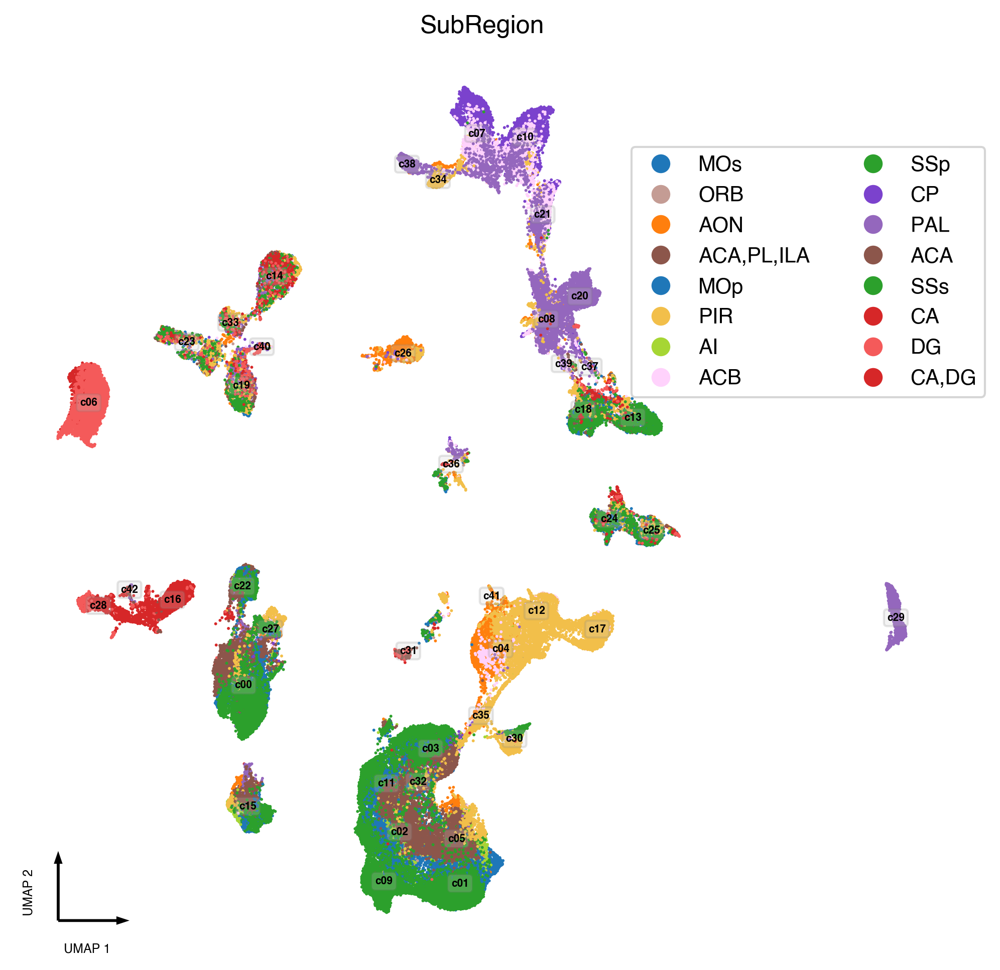

In [7]:
fig, ax = plt.subplots(figsize=(8, 8), dpi=300)
categorical_scatter(cell_meta, 
                    ax, 
                    coord_base=coords, 
                    hue='SubRegion',
                    text_anno='leiden',
                    palette=sub_region_palette,
                    show_legend=True,
                    scatter_kws=dict(s=2),
                    text_anno_kws=dict(fontsize=5),
                    legend_kws=dict(bbox_to_anchor=(1.05, 0.9)),
                    max_points=None)
ax.set_title('SubRegion')
fig.savefig(fig_dir / f'SubRegion_{coords}.pdf', bbox_inches='tight')

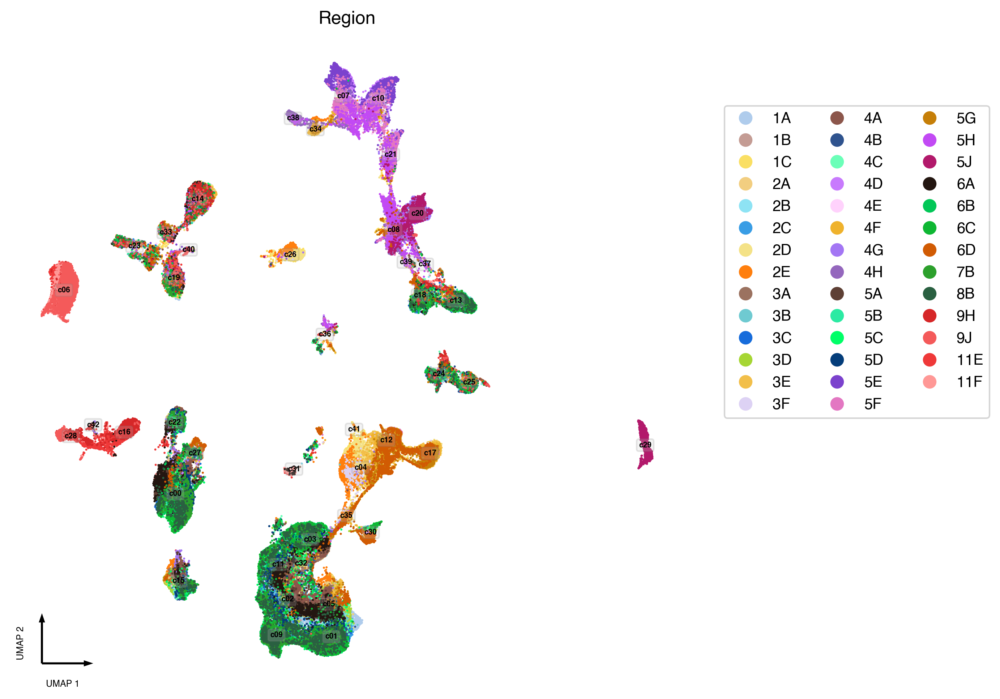

In [8]:
fig, ax = plt.subplots(figsize=(8, 8), dpi=300)
categorical_scatter(cell_meta, 
                    ax, 
                    coord_base=coords, 
                    hue='Region',
                    text_anno='leiden',
                    palette=region_palette,
                    show_legend=True,
                    scatter_kws=dict(s=2),
                    text_anno_kws=dict(fontsize=5),
                    legend_kws=dict(bbox_to_anchor=(1.05, 0.9)),
                    max_points=None)
ax.set_title('Region')
fig.savefig(fig_dir / f'Region_{coords}.pdf', bbox_inches='tight')

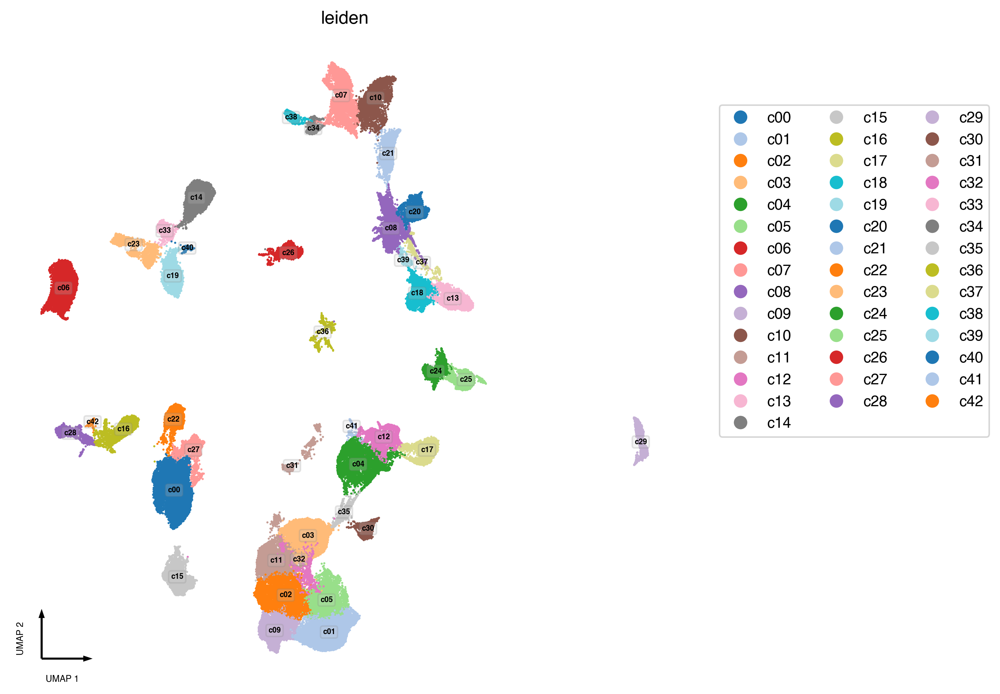

In [19]:
fig, ax = plt.subplots(figsize=(8, 8), dpi=300)
categorical_scatter(cell_meta, 
                    ax, 
                    coord_base=coords, 
                    hue='leiden',
                    text_anno='leiden',
                    palette=level_one_palette(cell_meta['leiden']),
                    show_legend=True,
                    scatter_kws=dict(s=2),
                    text_anno_kws=dict(fontsize=5),
                    legend_kws=dict(bbox_to_anchor=(1.05, 0.9)),
                    max_points=None)
ax.set_title('leiden')
fig.savefig(fig_dir / f'leiden_{coords}.pdf', bbox_inches='tight')

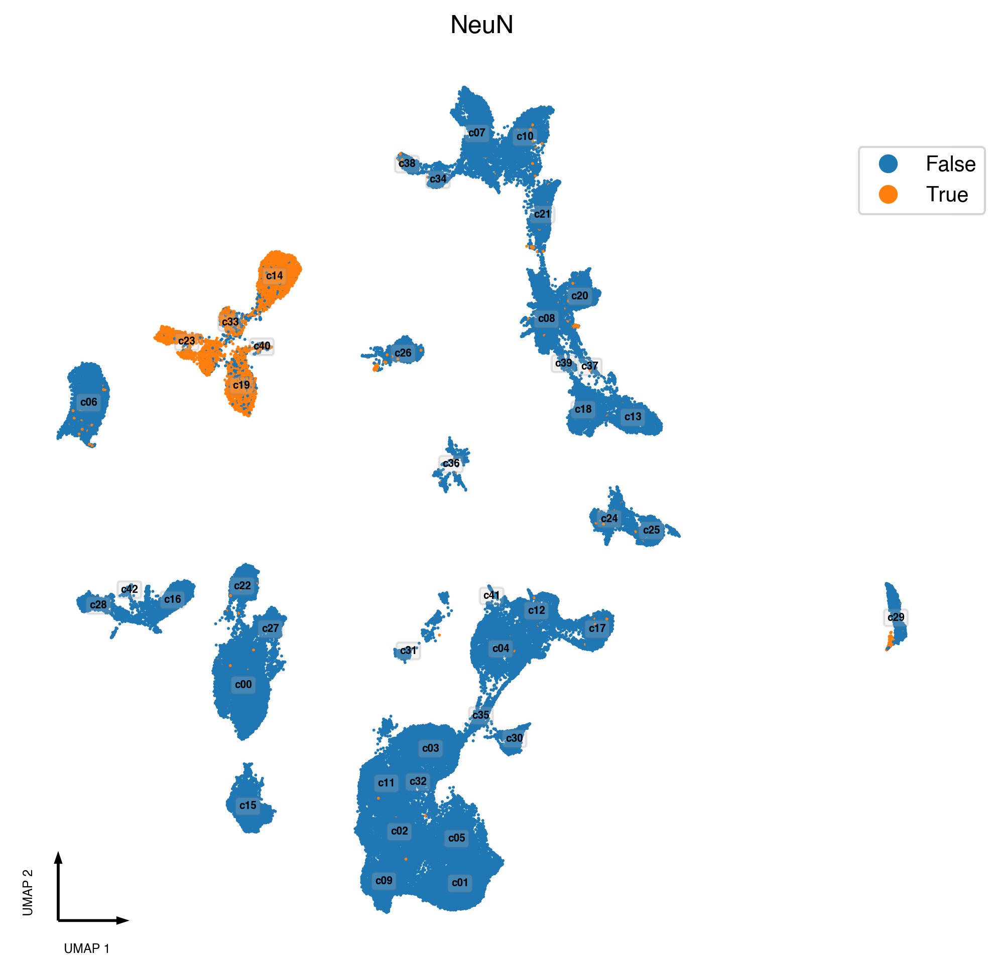

In [9]:
fig, ax = plt.subplots(figsize=(8, 8), dpi=300)
categorical_scatter(cell_meta, 
                    ax, 
                    coord_base=coords, 
                    hue=(cell_meta['Col96'] == 11),
                    text_anno='leiden',
                    palette='tab10',
                    show_legend=True,
                    scatter_kws=dict(s=2),
                    text_anno_kws=dict(fontsize=5),
                    legend_kws=dict(bbox_to_anchor=(1.05, 0.9)),
                    max_points=None)
ax.set_title('NeuN')

fig.savefig(fig_dir / f'MeuN_{coords}.pdf', bbox_inches='tight')

In [10]:
coords = 'tsne'

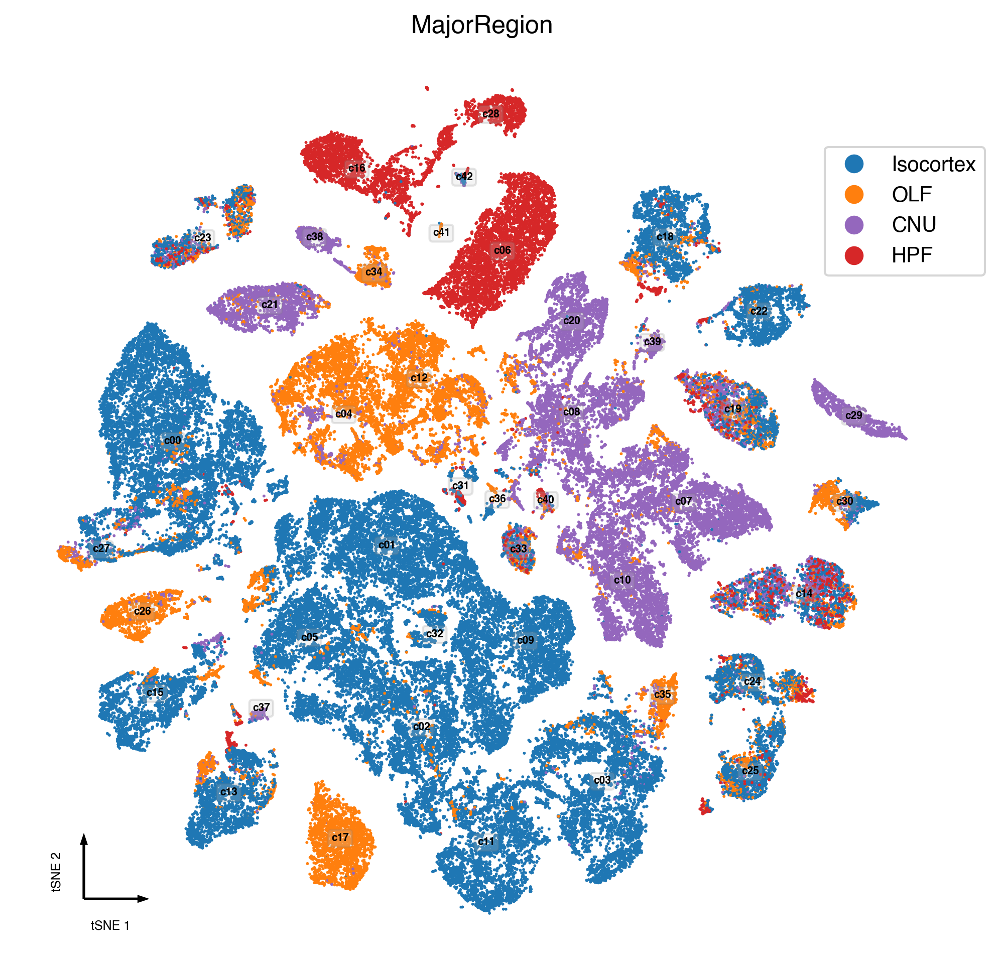

In [11]:
fig, ax = plt.subplots(figsize=(8, 8), dpi=300)
categorical_scatter(cell_meta, 
                    ax, 
                    coord_base=coords, 
                    hue='MajorRegion',
                    text_anno='leiden',
                    palette=major_region_palette,
                    show_legend=True,
                    scatter_kws=dict(s=2),
                    text_anno_kws=dict(fontsize=5),
                    legend_kws=dict(bbox_to_anchor=(1.05, 0.9)),
                    max_points=None)
ax.set_title('MajorRegion')
fig.savefig(fig_dir / f'MajorRegion_{coords}.pdf', bbox_inches='tight')

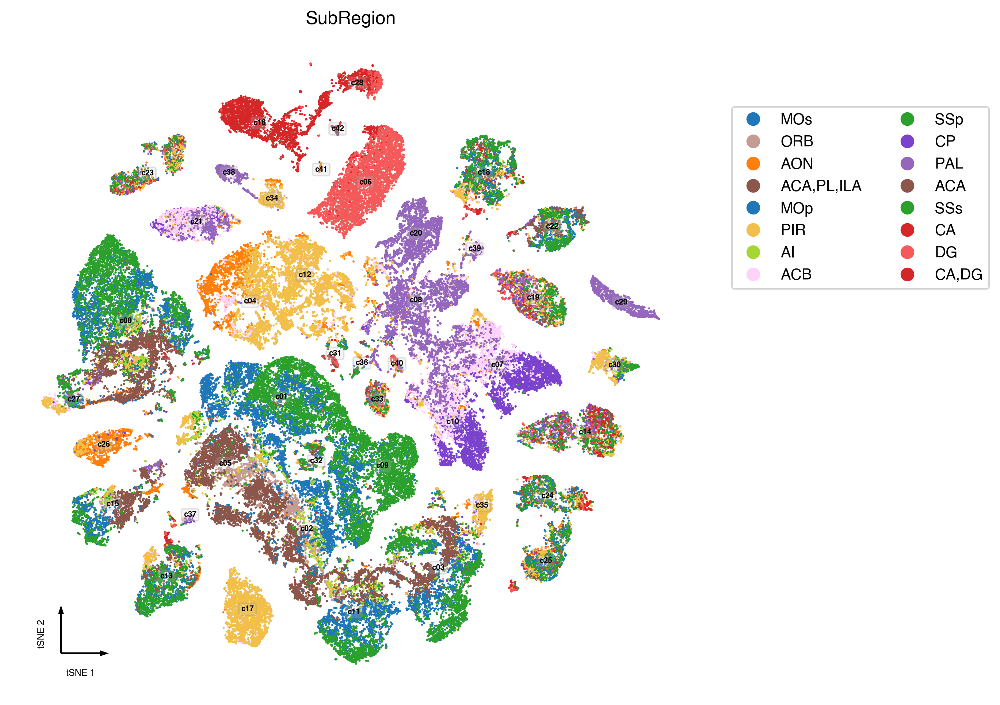

In [12]:
fig, ax = plt.subplots(figsize=(8, 8), dpi=300)
categorical_scatter(cell_meta, 
                    ax, 
                    coord_base=coords, 
                    hue='SubRegion',
                    text_anno='leiden',
                    palette=sub_region_palette,
                    show_legend=True,
                    scatter_kws=dict(s=2),
                    text_anno_kws=dict(fontsize=5),
                    legend_kws=dict(bbox_to_anchor=(1.05, 0.9)),
                    max_points=None)
ax.set_title('SubRegion')
fig.savefig(fig_dir / f'SubRegion_{coords}.pdf', bbox_inches='tight')

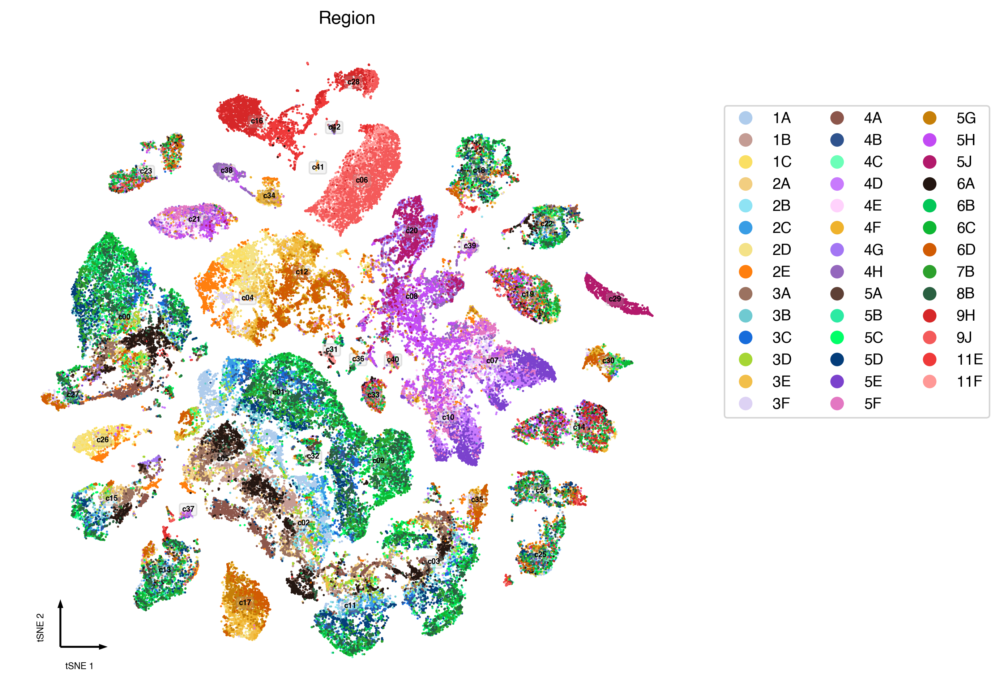

In [13]:
fig, ax = plt.subplots(figsize=(8, 8), dpi=300)
categorical_scatter(cell_meta, 
                    ax, 
                    coord_base=coords, 
                    hue='Region',
                    text_anno='leiden',
                    palette=region_palette,
                    show_legend=True,
                    scatter_kws=dict(s=2),
                    text_anno_kws=dict(fontsize=5),
                    legend_kws=dict(bbox_to_anchor=(1.05, 0.9)),
                    max_points=None)
ax.set_title('Region')
fig.savefig(fig_dir / f'Region_{coords}.pdf', bbox_inches='tight')

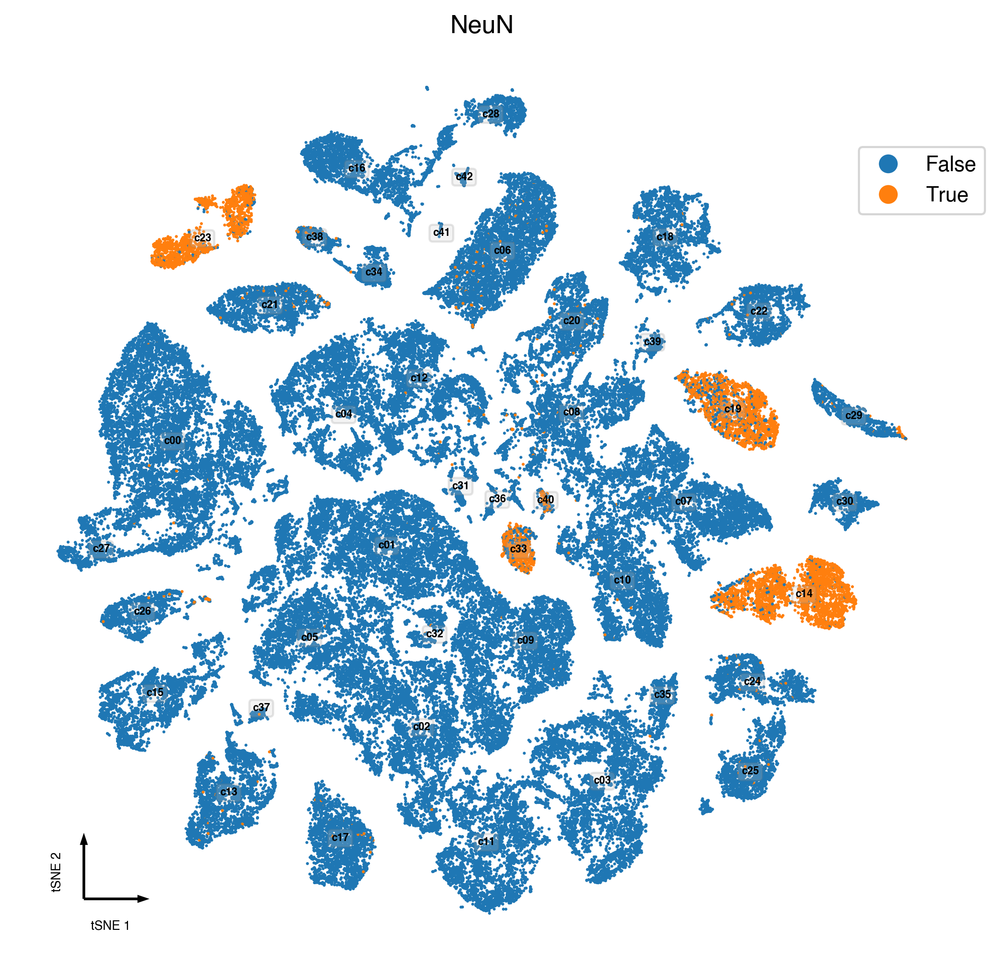

In [14]:
fig, ax = plt.subplots(figsize=(8, 8), dpi=300)
categorical_scatter(cell_meta, 
                    ax, 
                    coord_base=coords, 
                    hue=(cell_meta['Col96'] == 11),
                    text_anno='leiden',
                    palette='tab10',
                    show_legend=True,
                    scatter_kws=dict(s=2),
                    text_anno_kws=dict(fontsize=5),
                    legend_kws=dict(bbox_to_anchor=(1.05, 0.9)),
                    max_points=None)
ax.set_title('NeuN')

fig.savefig(fig_dir / f'MeuN_{coords}.pdf', bbox_inches='tight')

In [15]:
row_order = ['c00', 
             'c01', 
             'c02', 
             'c03', 
             'c04', 
             'c05',
             'c06', 
             'c07', 
             'c08', 
             'c09', 
             'c10', 
             'c11',
             'c12', 
             'c13', 
             'c14', 
             'c15', 
             'c16', 
             'c17',
             'c18', 
             'c19', 
             'c20', 
             'c21', 
             'c22', 
             'c23',
             'c24', 
             'c25', 
             'c26', 
             'c27', 
             'c28', 
             'c29',
             'c30', 
             'c31', 
             'c32', 
             'c33', 
             'c34', 
             'c35',
             'c36', 
             'c37', 
             'c38', 
             'c39', 
             'c40']
col_order = ['3F', '4E', '5F', '4D', '5E', '4G', '4H', 
             '5H', '5J', '9H', '11E', '9J', '11F', '5A', 
             '6A', '2A', '3A', '4A', '3D', '2C', '3C', 
             '4B', '5D', '1A', '2B', '3B', '1B', '4C', 
             '5B', '6B', '7B', '8B', '5C', '6C', '1C', 
             '2E', '2D', '3E', '4F', '5G', '6D']

count_data = cell_meta.groupby('leiden')['Region'].value_counts().unstack().fillna(0).astype(int).loc[row_order, col_order]
count_data.to_msgpack(result_dir / 'cluster_region_count.msg')


In [16]:
count_data.to_csv(result_dir / 'cluster_region_count.tsv', sep='\t')